# CSE 152A: Introduction to Computer Vision I, Fall 2024 - Assignment 0

## Problem 1: Image Operations and Vectorization (5 points)

Vector operations using `NumPy` can offer a significant speedup over doing an operation iteratively on an image. The problem below will demonstrate the time it takes for both approaches to change the color of quadrants of an image.

The problem reads an image `bear.png` that you will find in the assignment folder. Two functions are then provided as different approaches for doing an operation on the image. 

Your task is to follow through the code and fill the blanks in `vectorized()` function and compare the speed difference between `iterative()` and `vectorized()`.

Image shape: (1008, 756, 3)


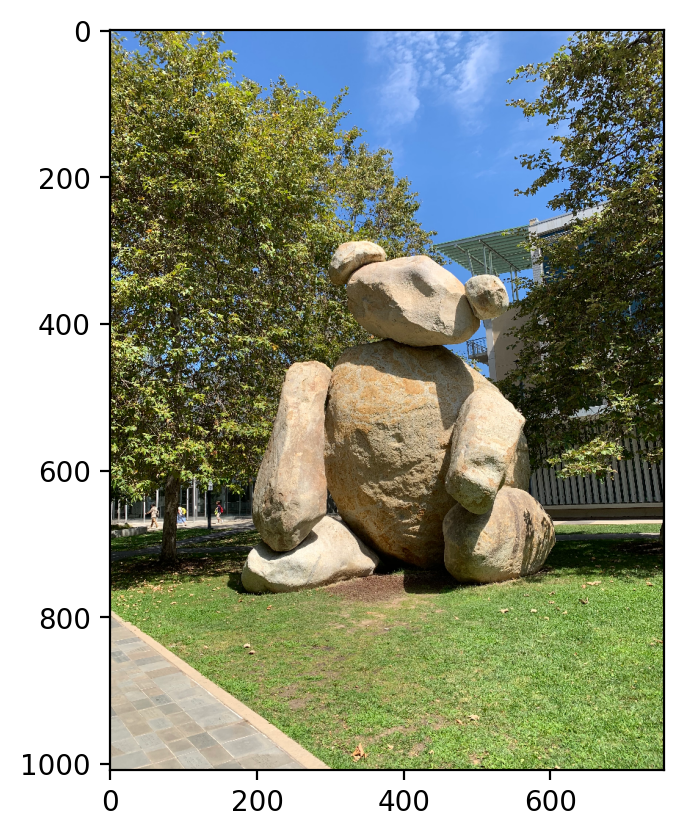

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import copy
import time

img = plt.imread('bear.png')                # Read an image 
print("Image shape:", img.shape)            # Print image size and color depth. The shape should be (H,W,C).
plt.imshow(img)                             # Show the original image
plt.show()

In [35]:
def iterative(img):
    """ Iterative operation. """
    image = copy.deepcopy(img)              # Create a copy of the image matrix
    for x in range(image.shape[0]):
        for y in range(image.shape[1]):
            if x < image.shape[0]/2 and y < image.shape[1]/2:
                image[x,y] = image[x,y] * np.array([1,0,0])    # Keep the red channel
            elif x > image.shape[0]/2 and y < image.shape[1]/2:
                image[x,y] = image[x,y] * np.array([0,0,1])    # Keep the blue channel
            elif x < image.shape[0]/2 and y > image.shape[1]/2:
                image[x,y] = image[x,y] * np.array([0,1,1])    # Keep the green and blue channels
            else:
                pass
    return image

def vectorized(img):
    """ Vectorized operation. """
    image = copy.deepcopy(img)
    a = int(image.shape[0]/2)
    b = int(image.shape[1]/2)
    image[:a,:b] = image[:a,:b] * np.array([1,0,0])       # Keep the red channel
    
    # Please also keep the blue channel / green and blue channels respectively in image[a:, :b] and image[:a, b:]
    # with the vectorized operation as shown above. You need to make sure your final generated image in this
    # vectorized() function is the same as the one generated from iterative().
    
    #### Write your code here. ####
    image[a:,:b] =  image[a:,:b]* np.array([0,0,1])      # Keep the blue channel
    image[:a,b:] =  image[:a,b:]* np.array([0,1,1])      # Keep the green and blue channels
    
    return image

Now, run the following cell to compare the difference between iterative and vectorized operation.

Iterative operation (sec): 2.134000062942505
Vectorized operation (sec): 0.010000228881835938


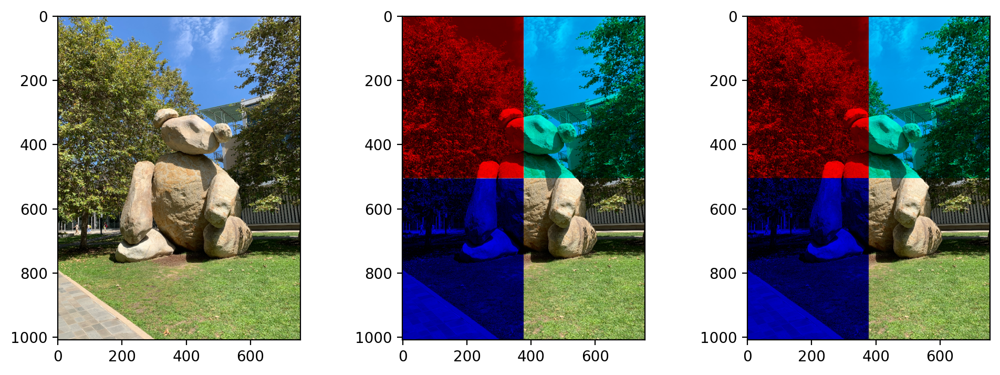

In [36]:
import time

def compare():
    img = plt.imread('bear.png') 
    cur_time = time.time()
    image_iterative = iterative(img)
    print("Iterative operation (sec):", time.time() - cur_time)
    
    cur_time = time.time()
    image_vectorized = vectorized(img)
    print("Vectorized operation (sec):", time.time() - cur_time)
    
    return image_iterative, image_vectorized

# Run the function
image_iterative, image_vectorized = compare()

# Plotting the results in sepearate subplots.
plt.figure(figsize=(12,4))   # Adjust the figure size.
plt.subplot(1, 3, 1)         # Create 1x3 subplots, indexing from 1
plt.imshow(img)              # Original image.

plt.subplot(1, 3, 2)       
plt.imshow(image_iterative)  # Iterative operations on the image.

plt.subplot(1, 3, 3)
plt.imshow(image_vectorized) # Vectorized operations on the image.

plt.show()                   # Show the figure.

# Note: The shown figures of image_iterative and image_vectorized should be identical!

## Problem 2: More Image Manipulation (45 points)

In this problem you will reuse the image `bear.png`. Being a color image, this image has three channels, corresponding to the primary colors of red, green and blue. 

(1) Read the image.

(2) Write your implementation to extract each of these channels separately to create single channel images. This means that from the $H\times W\times 3$ shaped image, you'll get three matrices of the shape $H\times W$ (Note that it's 2-dimensional). 

(3) Now, write a function to merge all these single channel images back into a 3-dimensional colored image. Merge the 2D images using the original channels order $(R,G,B)$ and another order $(G,B,R)$.

(4) Next, write another function to mirror the original image from left to right. For this function, please only use **Array Indexing** to implement this function and **do not** directly use the functions (e.g. `np.flip()`) that directly flips the matrix.

(5) Next, write another function to rotate the original image 90 degrees counterclockwise. For this function, please only use **Array Indexing** to implement this function and **do not** directly use the functions (e.g. `np.rot90()`) that directly rotates the matrix. Try to apply the rotation function once (i.e. 90-degree rotation) and twice (i.e. 180-degree rotation)

(6) Finally, consider **4 color images** you obtained: 2 from merging (RGB and GBR), 1 from mirroring (left to right) and 1 from rotation (180-degree). Using these 4 images, create one single image by tiling them together **without using loops**. The image will have $2\times 2$ tiles making the shape of the final image $2H \times 2W \times 3$. The order in which the images are tiled does not matter. Show the tiled image.

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import copy

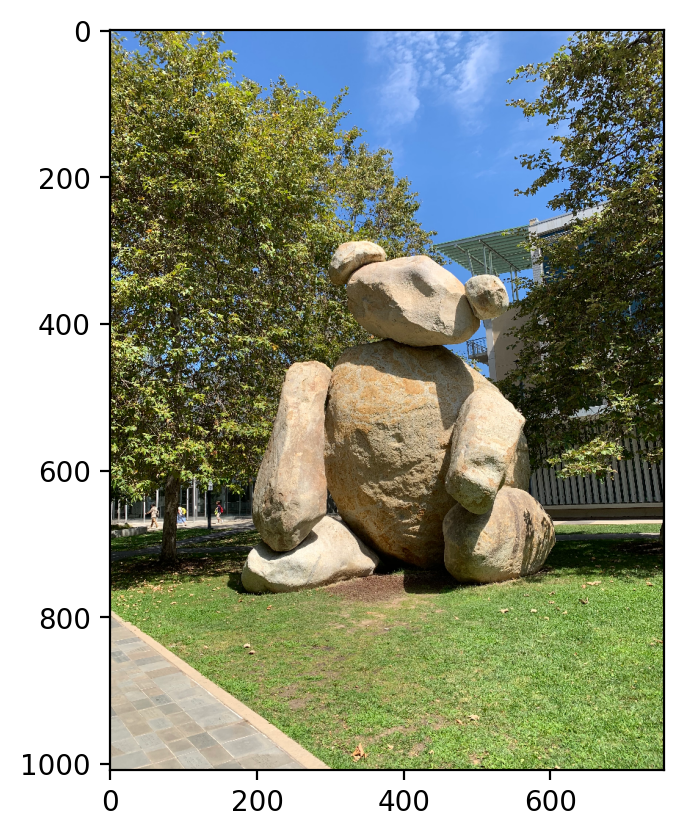

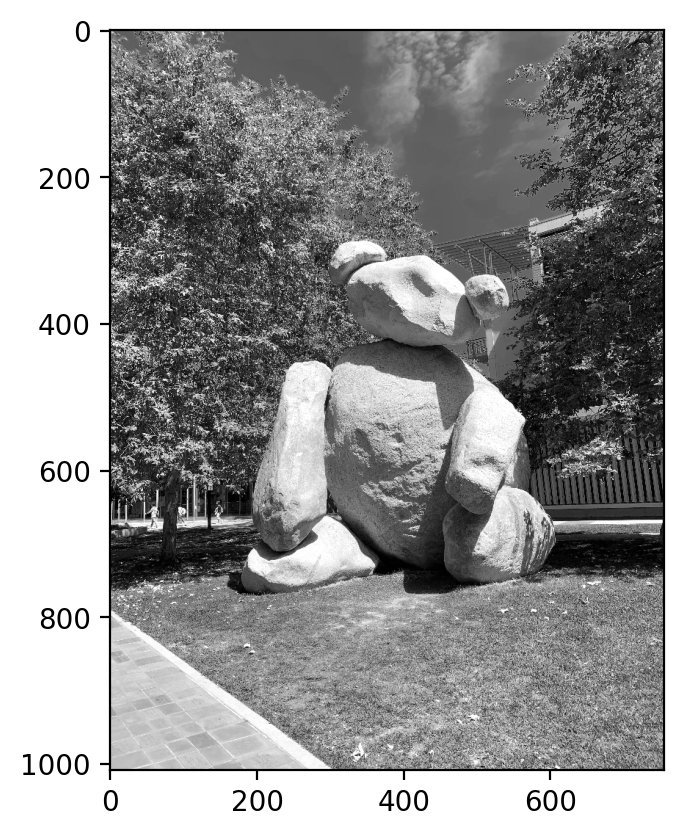

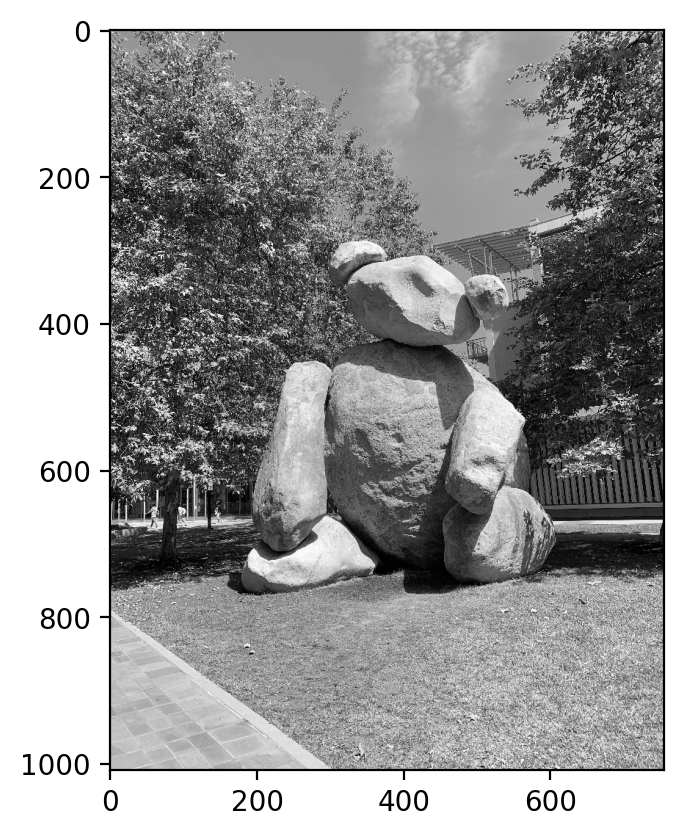

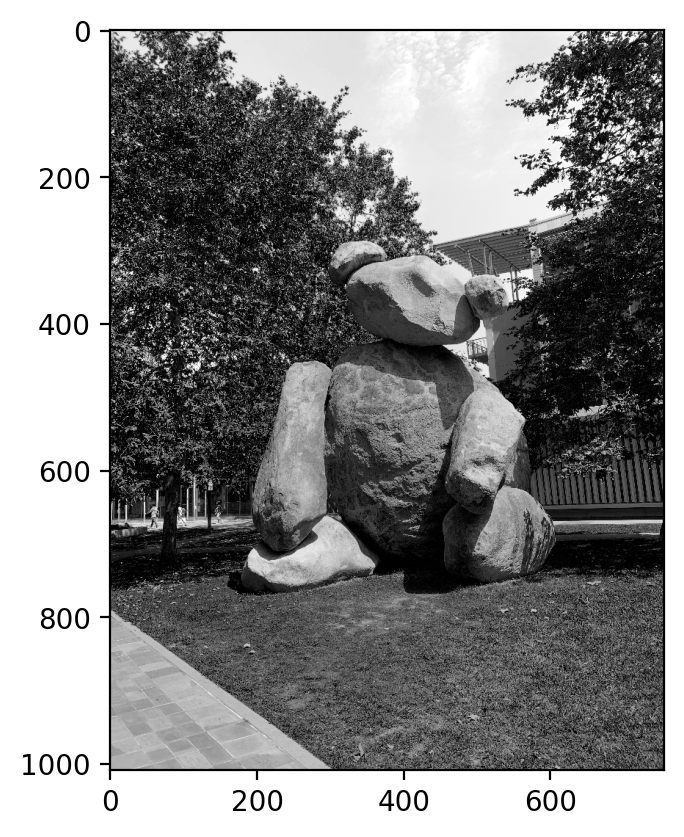

In [38]:
# (1) Read the image.
#### Write your code here. ####
img = plt.imread('bear.png')


plt.imshow(img) # Show the image after reading.
plt.show()


# (2) Extract single channel image.
def get_channel(img, channel):
    """
    Function to extract 2D image corresponding to a channel index from a color image. 
    This function should return a H*W array which is the corresponding channel of the input image. 

    Parameters:
    img: 3-dimensional array e.g. RGB image with shape (H,W,3)
    channel: integer (used to index the channel)
    """
    return img[:,:,channel]
    """
    2. 왜 초록색, 노란색, 파란색으로 보이는가?
        matplotlib는 채널의 값을 기본적으로 **컬러맵(cmap)**으로 표시합니다. 즉, 단일 채널의 데이터를 시각화할 때 cmap='viridis' 또는 다른 컬러맵이 기본으로 적용됩니다.
        각 채널을 시각화할 때 다음과 같은 결과를 볼 수 있습니다:
        빨간색 채널 (img[:, :, 0]): 초록 또는 노란빛.
        초록색 채널 (img[:, :, 1]): 초록/노란/푸른 톤.
        파란색 채널 (img[:, :, 2]): 파란색 중심.
        이는 데이터가 RGB 강도 값(0~255)을 가지더라도, matplotlib의 기본 설정으로 인해 색상으로 변환되어 보이는 것입니다.
    """
    
    

# # Test your implemented get_channel()
assert len(get_channel(img, 0).shape) == 2  # Index 0
plt.imshow(get_channel(img, 0),cmap='gray')
plt.show()
plt.imshow(get_channel(img, 1),cmap='gray')
plt.show()
plt.imshow(get_channel(img, 2),cmap='gray')
plt.show()

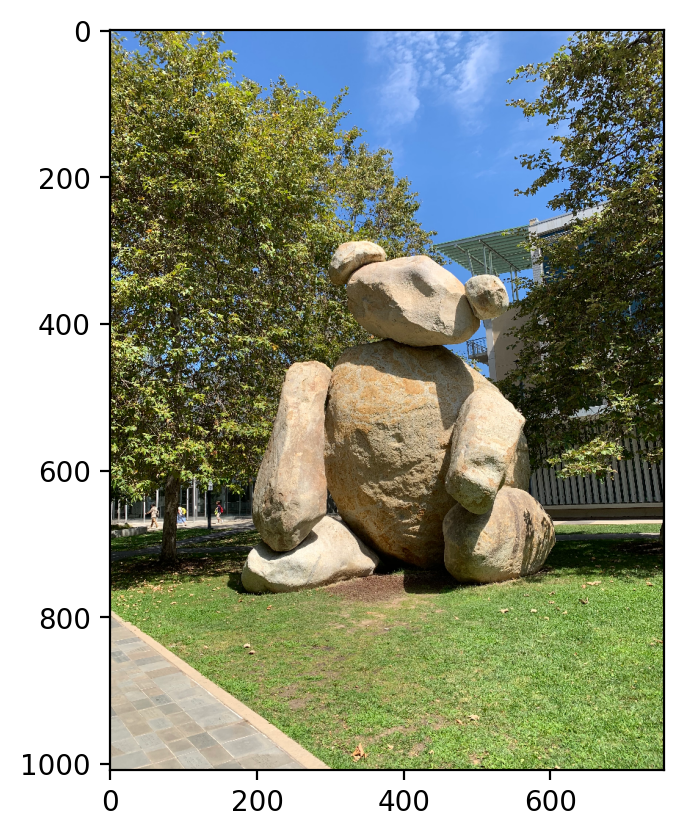

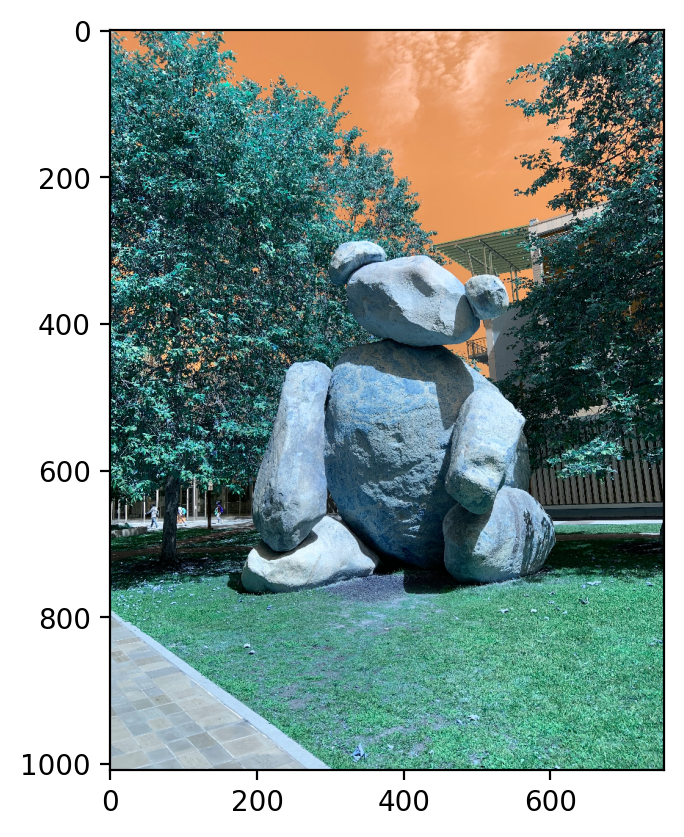

In [39]:
# (3) Merge channels.
def merge_channels(img0, img1, img2):
    """ 
    Function to merge three single channel images to form a color image. 
    This function should return a H*W*3 array which merges all three single channel images 
    (i.e. img0, img1, img2) in the input.
    
    Parameters:
    img0: 2-dimensional array e.g. single channel image with shape (H,W)
    img1: 2-dimensional array e.g. single channel image with shape (H,W)
    img2: 2-dimensional array e.g. single channel image with shape (H,W)
    """
    # Hint: There are multiple ways to implement it. 
    #       1. For example, create a H*W*C array with all values as zero and 
    #          fill each channel with given single channel image. 
    #          You may refer to the "Modify a subarray" section in the brief NumPy tutorial above.
    #       2. You may find np.stack() / np.concatenate() / np.reshape() useful in this problem.
    
    #### Write your code here. ####

    # # 방법1 - 새로운 nparray 만들어서 하나씩 적용시키기
    # merged = np.zeros((img0.shape[0], img0.shape[1], 3))
    # merged[:,:,0] = img0
    # merged[:,:,1] = img1
    # merged[:,:,2] = img2

    # 방법2 - dstack 이용하기 
    merged = np.dstack([img0, img1, img2])
    return merged
    

img0 = get_channel(img, 0)  # Get single channel images.
img1 = get_channel(img, 1)
img2 = get_channel(img, 2)

#### Write your code here. ####
RGB_img = merge_channels(img0,img1,img2)                          # Merge the channels in R,G,B order (the same as original)
GBR_img = merge_channels(img2,img1,img0)                          # Merge the channels in G,B,R order
plt.imshow(RGB_img)
plt.show()
plt.imshow(GBR_img)
plt.show()

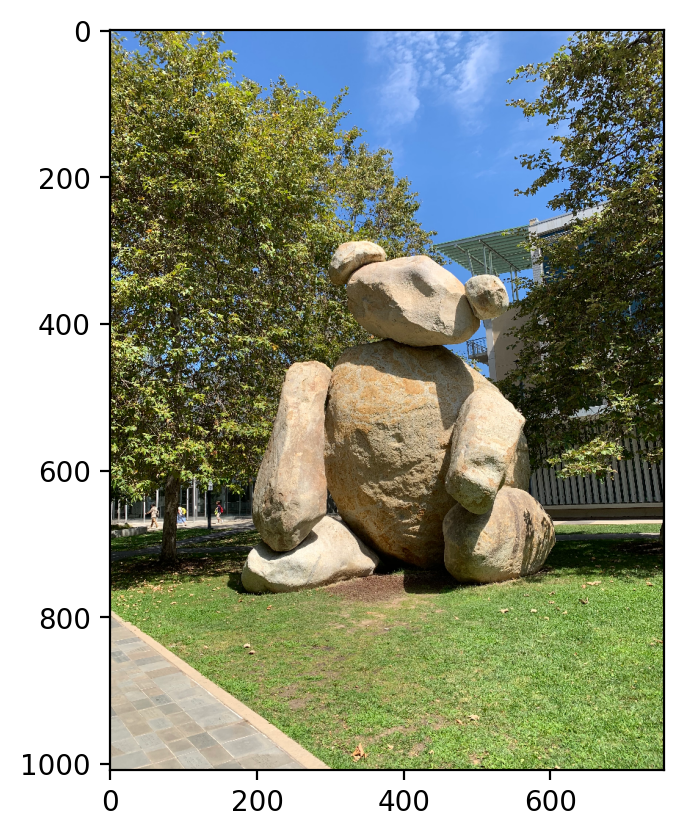

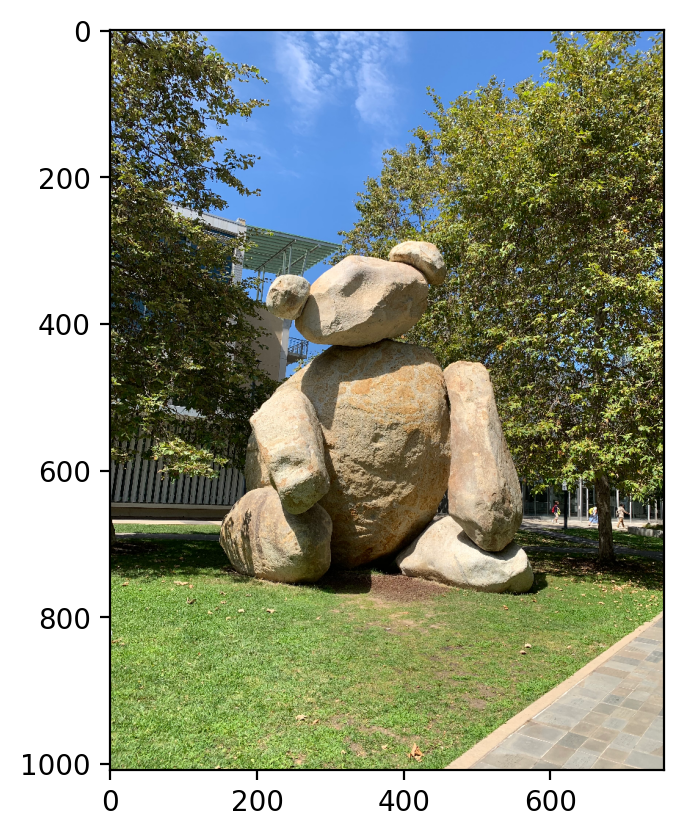

In [40]:
# (4) Mirror the image from left to right.
def mirror_img(img):
    """
    Function to mirror image from left to right. 
    This function should return a H*W*3 array which is the mirrored version of original image.

    Parameters:
    img: 3-dimensional array e.g. RGB image of shape (H,W,3)
    """     
    #### Write your code here. ####
    flipped = copy.deepcopy(img)
    height, width, _ = img.shape
    for col in range(0,width//2):
        for row in range(0,height):
            temp = copy.deepcopy(flipped[row, col,:])
            flipped[row, col,:]=flipped[row, width-col-1,:]
            flipped[row, width-col-1,:]=temp
    return flipped


plt.imshow(img)
plt.show()
mirrored_img = mirror_img(img)
plt.imshow(mirrored_img)
plt.show()

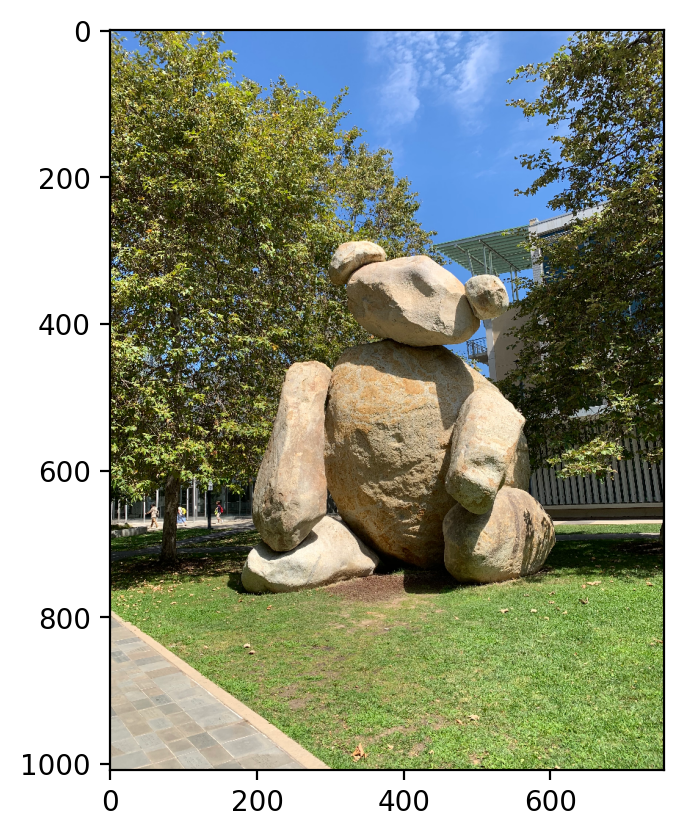

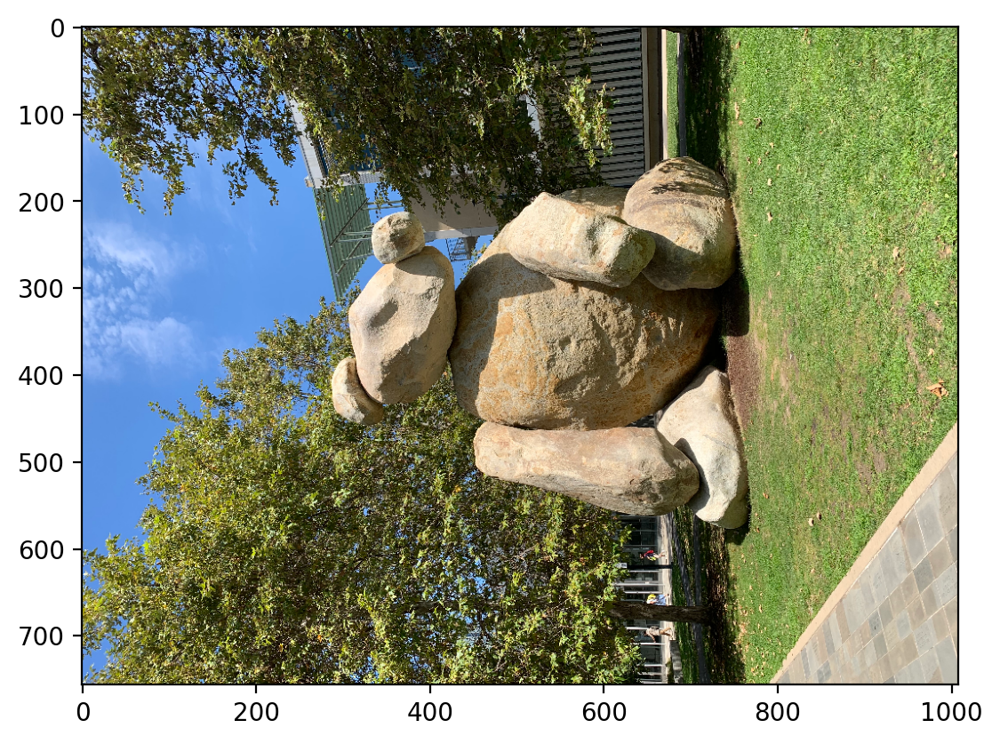

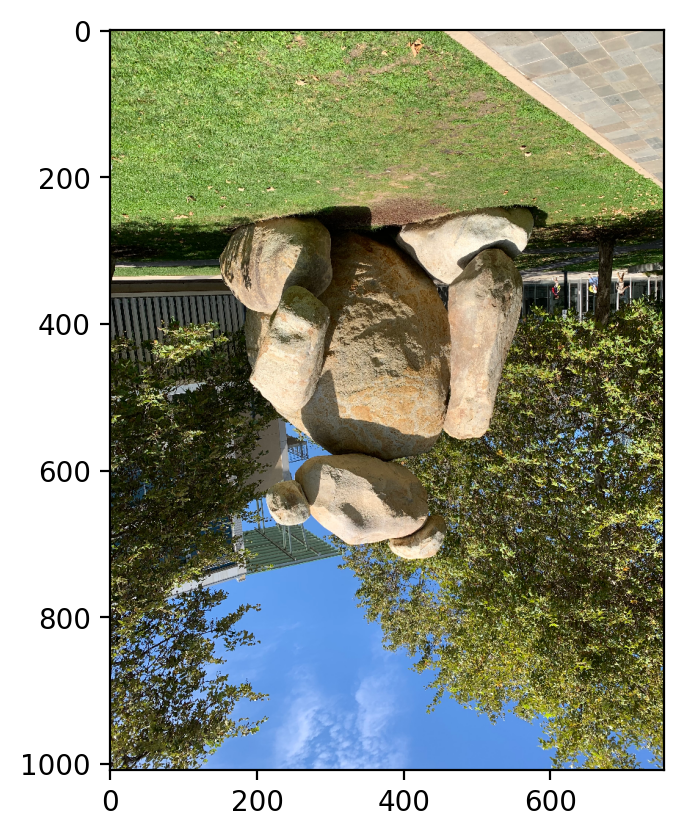

In [41]:
# (5) Rotate image.
def rotate_img(img):
    """
    Function to rotate image 90 degrees counter-clockwise. 
    This function should return a W*H*3 array which is the rotated version of original image.
    
    Parameters:
    img: 3-dimensional array e.g. RGB image of shape (H,W,3)
    """
    #### Write your code here. ####
    height, width, _ = img.shape
    rotate_img = np.zeros((width, height,3))
    for row in range(0,height):
        for col in range(0,width):
            rotate_img[col][row]=img[row][width-col-1]
    return rotate_img
    
    

plt.imshow(img)
plt.show()
rot90_img = rotate_img(img)
plt.imshow(rot90_img)
plt.show()
rot180_img = rotate_img(rotate_img(img))
plt.imshow(rot180_img)
plt.show()

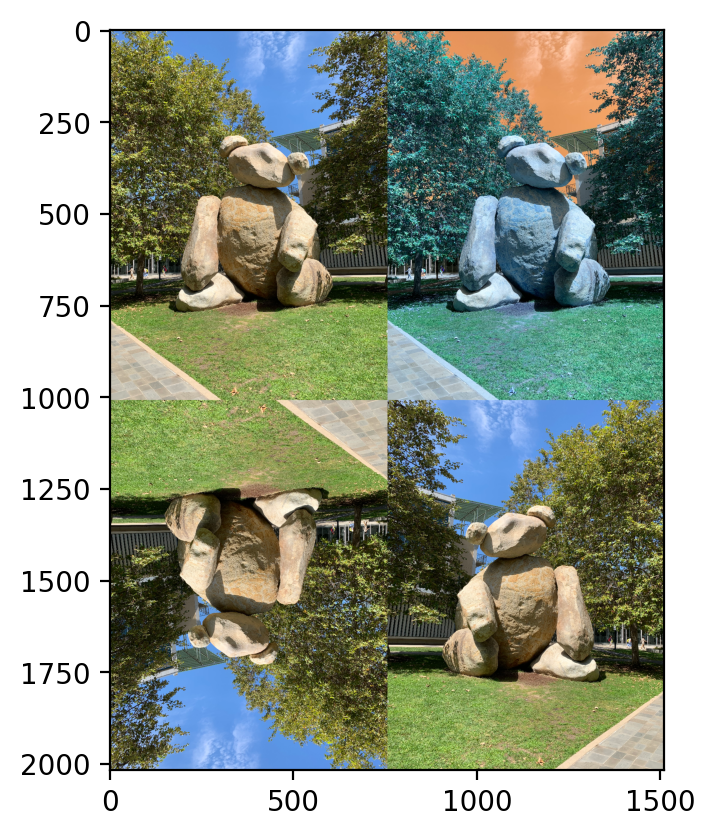

In [43]:
# (6) Write your code here to tile four images and make a single image. 
# You can use the RGB_img, GBR_img, mirrored_img, rot180_img to represent the four tiles.
# After tiling, please display the tiled image.

#### Write your code here. ####
height, width, _=img.shape
tiled_img=np.zeros((height*2,width*2,3))

# 1st dim: rgb img
tiled_img[:height,:width] = img

# 2nd dim: gbr img
img0 = get_channel(img, 0)
img1 = get_channel(img, 1)
img2 = get_channel(img, 2)
GBR_img = merge_channels(img2,img1,img0) 
tiled_img[:height,width:] = GBR_img

# 3rd dim: mirrored img
mirrored_img = mirror_img(img)
tiled_img[height:,width:] = mirrored_img

# 4th dim: rotated img
rot180_img = rotate_img(rotate_img(img))
tiled_img[height:,:width] = rot180_img

plt.imshow(tiled_img)